In [1]:
%%capture
#This cell is for downloading and preparing data
#-------------------------------------------------
#gdown is used for downloading dataset to storage
!pip install gdown
#Downloading dataset
import gdown
file_id = ""  # Replace this with your file's ID
output_file = "data_file.zip"  # Replace "data_file.ext" with the desired output filename and extension
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)
#Extracting zip file
!unzip data_file.zip


In [2]:
!pip uninstall tensorflow -y
!pip uninstall keras -y
!pip install tensorflow==2.15.0
!pip install keras==3.0.5

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: keras 3.0.5
Uninstalling keras-3.0.5:
  Successfully uninstalled keras-3.0.5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 24.3 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the sou

In [3]:
#General Imports
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import keras

2024-05-22 06:05:44.507956: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-22 06:05:44.508016: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-22 06:05:44.509408: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
#Numpy and tensorflow Random Seed for reproducability
np.random.seed(32)
tf.random.set_seed(69)

In [5]:
print(keras.__version__)
print(tf.__version__)

3.0.5
2.15.0


In [6]:
#Helper functions
def random_split_array(data, ratios=(0.8, 0.1, 0.1)):
    np.random.shuffle(data)  # Shuffle for randomness
    split_indices = np.cumsum(ratios[:-1]) * len(data)
    return np.split(data, split_indices.astype(int))

In [7]:
#Train-test-val split
original = []
for i in range(131) :
    original.append(i)

train, test, val = random_split_array(original,(0.8,0.1,0.1))
print(train)
print(test)
print(val)
#These arrays will contain paths of images, and liver mask
X_train = []
Y_train = []
X_test = []
Y_test = []
X_val = []
Y_val = []

scan_list = os.listdir("//kaggle/working/Task03_Liver")
scan_list.sort()
for i in scan_list:
    num = int(i.split("_")[-1])
    path = "/kaggle/working/Task03_Liver/" + i
    imgpath = path + "/images"
    maskpath = path + "/masks"
    piclist = os.listdir(imgpath)
    if num in train:
        for j in piclist:
            X_train.append(imgpath + "/" + j)
            Y_train.append(maskpath + "/liver/" +j)
    elif num in test:
        for j in piclist:
            X_test.append(imgpath + "/" + j)
            Y_test.append(maskpath + "/liver/" +j)
    else:
        for j in piclist:
            X_val.append(imgpath + "/" + j)
            Y_val.append(maskpath + "/liver/" +j)



[ 21 107  93  99  86  73  37  28  56  27  13  55  23  78 103  76  26 115
  75  22   5   2  39  20  91 114  16 108  49  66 117  94  32  60  63 102
 120 118  72   8  36  17  87 112 109  46 122 113  40   7  12  33 125  70
 123   1  15  41  53  67  44   0 129  31  51  58  85  14  25  18  59  48
 126  79 130  47  92 110  45 119  61 111  74 105  83  80  30  97  68   6
  96  64  95  52  29  90  98 127 116  77  38  69  57 104]
[100  50  84  10  82  42  24  35  34  65 121  81  11]
[  4   9 106 101   3  89  71 128  19  88  62 124  54  43]


In [8]:
#These functions will convert the path to the actual image by loading it from the memory.

def load_and_preprocess_x(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    return image

def load_and_preprocess_3(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.grayscale_to_rgb(image)
    return image

def load_and_preprocess_1(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image

def augfun(image,mask):
    angle = tf.random.uniform(shape=[], minval=0, maxval=180, dtype=tf.float32)
    image = tf.image.rot90(image, k=tf.cast(angle / 90, tf.int32))
    mask = tf.image.rot90(mask, k=tf.cast(angle / 90, tf.int32))
    return (image,mask)

#Generating tf datasets
image_ds = tf.data.Dataset.from_tensor_slices(X_train)
image_ds = image_ds.map(load_and_preprocess_x, num_parallel_calls=tf.data.AUTOTUNE)
mask_ds = tf.data.Dataset.from_tensor_slices(Y_train)
mask_ds = mask_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = tf.data.Dataset.zip((image_ds,mask_ds))
train_ds  = train_ds.map(augfun, num_parallel_calls = tf.data.AUTOTUNE)
image1_ds = tf.data.Dataset.from_tensor_slices(X_val)
image1_ds = image1_ds.map(load_and_preprocess_x, num_parallel_calls=tf.data.AUTOTUNE)
mask1_ds = tf.data.Dataset.from_tensor_slices(Y_val)
mask1_ds = mask1_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.zip((image1_ds,mask1_ds))

image2_ds = tf.data.Dataset.from_tensor_slices(X_test)
image2_ds = image2_ds.map(load_and_preprocess_x, num_parallel_calls=tf.data.AUTOTUNE)
mask2_ds = tf.data.Dataset.from_tensor_slices(Y_test)
mask2_ds = mask2_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.zip((image2_ds,mask2_ds))

In [9]:
for i in train_ds:
    x,y = i
    break

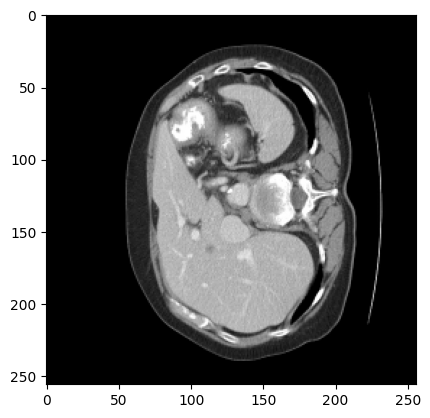

In [10]:
plt.imshow(x/255.0)
#Here the 255.0 is just for visualization, as the image is of type tf.float32, plt assumes its capped between 0 and 1 (which it isnt, hence I divided it by 255)

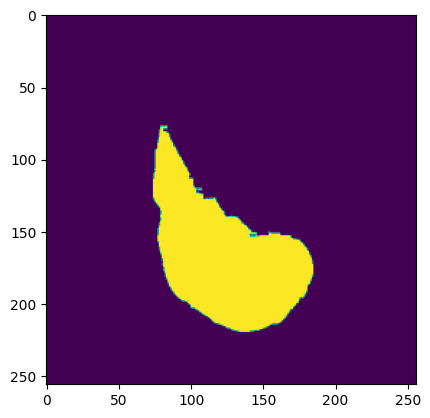

In [11]:
plt.imshow(y)

In [12]:
print(x.shape)

(256, 256, 3)


In [13]:
print(y.shape)

(256, 256, 1)


In [14]:
from tensorflow.keras import layers

def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.keras.layers.ReLU()(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]),
        interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    preprocessed = keras.applications.resnet50.preprocess_input(model_input)
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=preprocessed
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same", activation = "sigmoid")(x)
    #model_output = tf.keras.activations.sigmoid(model_output)
    return keras.Model(inputs=model_input, outputs=model_output, name="DeepLabvthreeplus")


In [15]:
model = DeeplabV3Plus(image_size=256, num_classes=1)
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "DeepLabvthreeplus"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 256, 256)  │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 256, 256)  │          0 │ input_layer[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 256, 256)  │          0 │ input_layer[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 256, 256,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 256, 256,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ add[0][0]         │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c

 Total params: 11,852,353 (45.21 MB)

 Trainable params: 11,819,617 (45.09 MB)

 Non-trainable params: 32,736 (127.88 KB)

In [16]:
#Defining dice loss functions. dice is actual dice-function value, while dice_loss is 1-dice. if dice_loss is minimized, dice is maximized.
def dice_loss(y_true,y_pred):
    return 1 - dice(y_true,y_pred)

def dice(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2. * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator)
    return dice

def dice0(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2. * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator)
    return dice

In [17]:
#General callbacks
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path1 = "model_checkpoint_epoch_{epoch:02d}.weights.h5"
weight_path2 = "model_checkpoint_best.weights.h5"

checkpoint1 = ModelCheckpoint(weight_path1, monitor='val_dice_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = True)

checkpoint2 = ModelCheckpoint(weight_path2, monitor='val_dice_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=3,
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-8)
early = EarlyStopping(monitor="val_loss",
                      mode="min",
                      patience=10) 
callbacks_list = [checkpoint1, checkpoint2, early, reduceLROnPlat]

In [18]:
BATCH_SIZE = 32
train_ds = train_ds.shuffle(buffer_size=100)  # Shuffle dataset for better training
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)

In [19]:
#Adam optimizer
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-3), loss=dice_loss, metrics = [dice, dice_loss])

In [20]:
#Training the Model
history = model.fit(train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks = callbacks_list,
)

Epoch 1/100


2024-05-22 06:07:14.268334: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[256,304,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,304,64,64]{3,2,1,0}, f32[32,256,64,64]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-22 06:07:16.762810: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 3.4945641s
Trying algorithm eng0{} for conv (f32[256,304,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,304,64,64]{3,2,1,0}, f32[32,256,64,64]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-22 06:07:19.009054: E external/lo

466/467 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - dice: 0.8752 - dice_loss: 0.1248 - loss: 0.1248

2024-05-22 06:11:52.487504: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[256,304,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[17,304,64,64]{3,2,1,0}, f32[17,256,64,64]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-22 06:11:53.346559: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.859173388s
Trying algorithm eng0{} for conv (f32[256,304,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[17,304,64,64]{3,2,1,0}, f32[17,256,64,64]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-22 06:11:54.867514: E external/

467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - dice: 0.8753 - dice_loss: 0.1247 - loss: 0.1247
Epoch 1: val_dice_loss improved from inf to 0.20188, saving model to model_checkpoint_epoch_01.weights.h5

Epoch 1: val_dice_loss improved from inf to 0.20188, saving model to model_checkpoint_best.weights.h5
467/467 ━━━━━━━━━━━━━━━━━━━━ 402s 642ms/step - dice: 0.8754 - dice_loss: 0.1246 - loss: 0.1246 - val_dice: 0.7981 - val_dice_loss: 0.2019 - val_loss: 0.2019 - learning_rate: 0.0010
Epoch 2/100
467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - dice: 0.9522 - dice_loss: 0.0478 - loss: 0.0478
Epoch 2: val_dice_loss improved from 0.20188 to 0.06851, saving model to model_checkpoint_epoch_02.weights.h5

Epoch 2: val_dice_loss improved from 0.20188 to 0.06851, saving model to model_checkpoint_best.weights.h5
467/467 ━━━━━━━━━━━━━━━━━━━━ 240s 514ms/step - dice: 0.9522 - dice_loss: 0.0478 - loss: 0.0478 - val_dice: 0.9315 - val_dice_loss: 0.0685 - val_loss: 0.0685 - learning_rate: 0.0010
Epoch 3/100
46

In [21]:
#Loading best validation weights for testing further
model.load_weights("/kaggle/working/model_checkpoint_best.weights.h5")

In [22]:
#Generating test arrays from test_ds
Xts =[]
Yts =[]
for i in test_ds:
    x,y=i
    Xts.append(x)
    Yts.append(y)

In [23]:
#Evaluating model on test dataset
model.evaluate(np.array(Xts),np.array(Yts))

63/63 ━━━━━━━━━━━━━━━━━━━━ 19s 304ms/step - dice: 0.9631 - dice_loss: 0.0369 - loss: 0.0369


[0.042895179241895676, 0.9571047425270081, 0.042895179241895676]

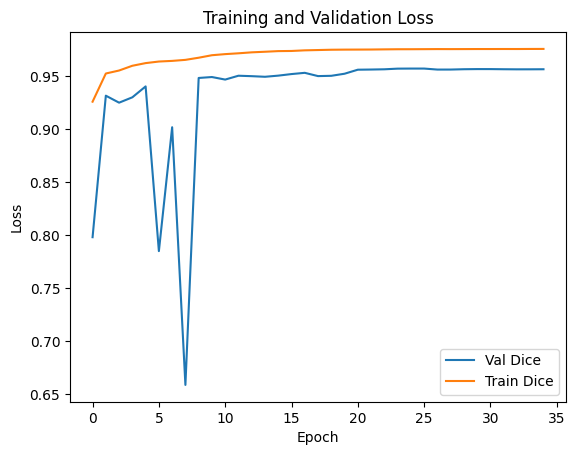

In [24]:
#Training and validation loss curves
plt.plot(history.history['val_dice'], label='Val Dice')
plt.plot(history.history['dice'], label='Train Dice')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step


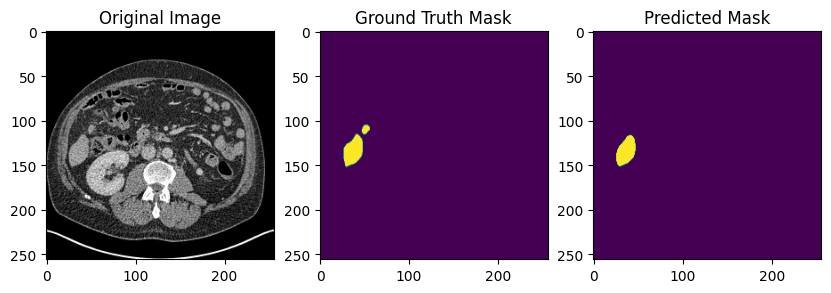

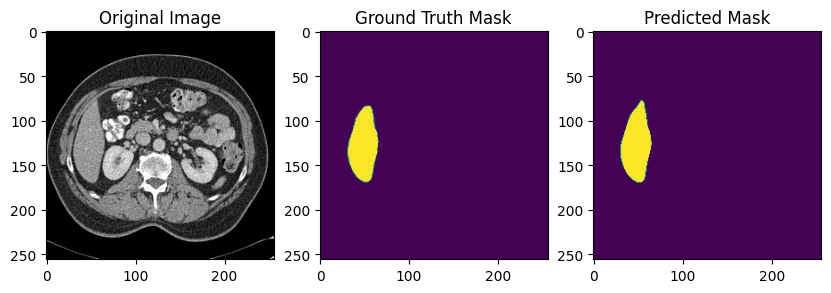

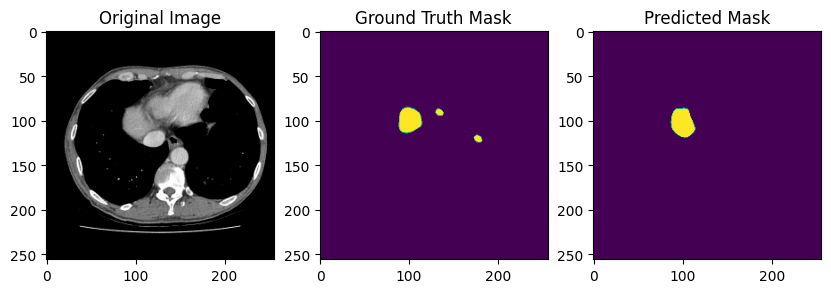

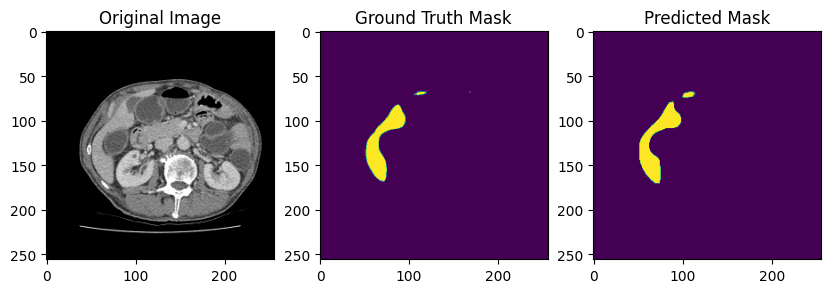

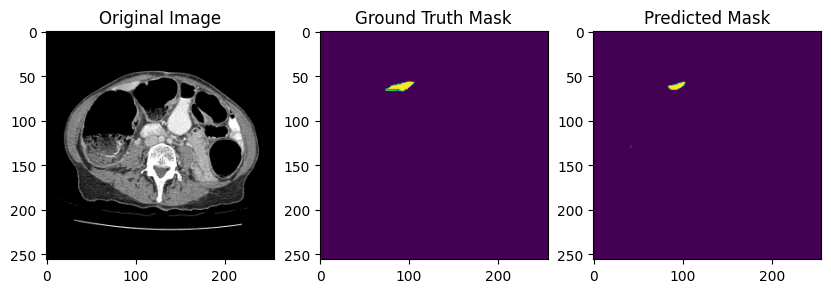

...

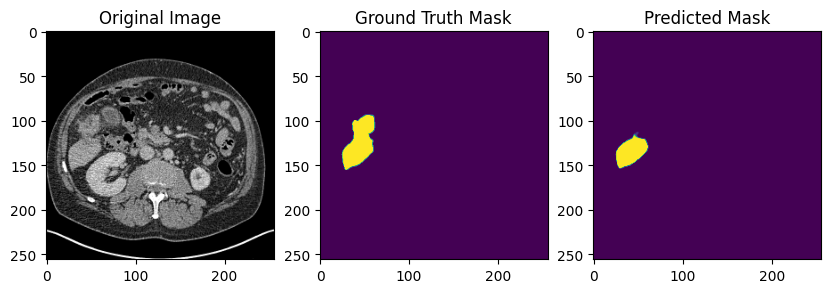

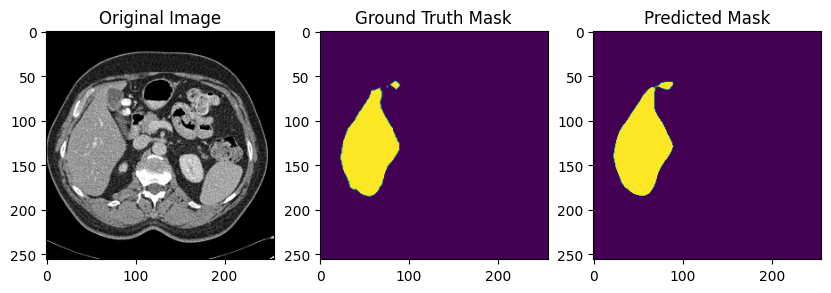

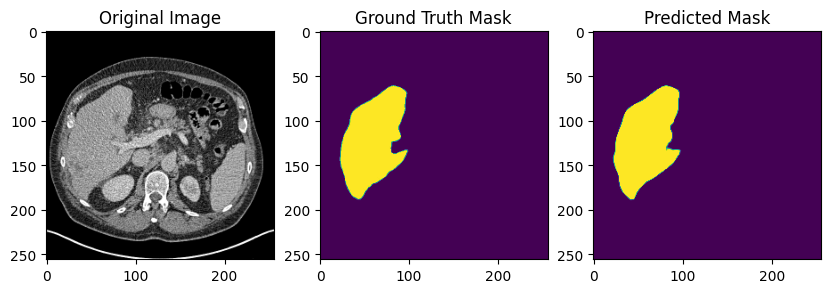

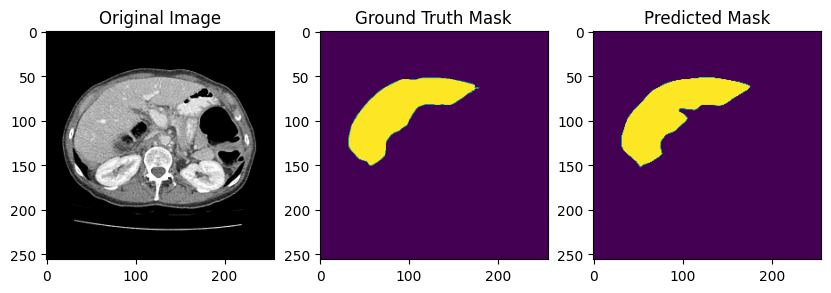

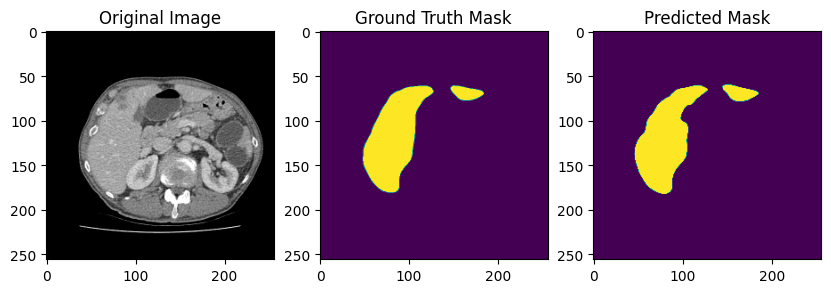

In [25]:
##This section chooses 100 random images from X_test and Y_test and shows the model output on them, along with input and ground truth
import random
# Select 100 random images from X_test and Y_test
random_indices = random.sample(range(len(X_test)), 100)
selected_X_test = [X_test[i] for i in random_indices]
selected_Y_test = [Y_test[i] for i in random_indices]
g3 = lambda x:load_and_preprocess_x(x)
g1 = lambda x:load_and_preprocess_1(x)
imgs = [g3(x) for x in selected_X_test]
# Evaluate the model on the selected images
y_pred = model.predict(np.array(imgs))

# Compare the model output and Y
for i in range(100):
  plt.figure(figsize=(10, 5))

  # Original image
  plt.subplot(1, 3, 1)
  plt.imshow(g3(selected_X_test[i])/255.0)
  plt.title('Original Image')

  # Ground truth mask
  plt.subplot(1, 3, 2)
  plt.imshow(g1(selected_Y_test[i]))
  plt.title('Ground Truth Mask')

  # Predicted mask
  plt.subplot(1, 3, 3)
  plt.imshow(y_pred[i])
  plt.title('Predicted Mask')

  plt.show()